# PyTorch: IBA (Per-Sample Bottleneck)

This notebook shows how to apply the Per-Sample Bottleneck to pretrained ImageNet models. 

Ensure that `./imagenet` points to your copy of the ImageNet dataset. 

You might want to create a symlink:

In [1]:
from google.colab import drive
import sys
drive.mount('/content/drive', force_remount=True)


Mounted at /content/drive


In [2]:
sys.path.append('/content/drive/MyDrive/Prak_MLMI')
sys.path.append('/content/drive/MyDrive')
sys.path.append('/content/drive/MyDrive/Prak_MLMI/model')

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
import matplotlib.patches as patches

In [5]:
%%capture
pip install torchray

In [6]:
# to set you cuda device
%env CUDA_VISIBLE_DEVICES=0

%reload_ext autoreload
%autoreload 2

import torch
import torchvision.models 
from torch import nn
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision.transforms import Compose, CenterCrop, ToTensor, Resize, Normalize, Grayscale
import matplotlib.pyplot as plt 
import os
from tqdm import tqdm_notebook
import json
from PIL import Image
import numpy as np
import sys

try:
    import IBA
except ModuleNotFoundError:
    sys.path.insert(0, '..')
    import IBA
  
from IBA.pytorch import IBA, tensor_to_np_img
from IBA.utils import plot_saliency_map

label_path = '/content/drive/MyDrive/Prak_MLMI/model/labels'
import cxr_dataset as CXR
import merged_visualize_prediction as V
import pandas as pd

env: CUDA_VISIBLE_DEVICES=0


In [7]:
%%timeit
%%capture
!unzip -o "/content/drive/MyDrive/Prak_MLMI/BrixIA_small.zip" -d /content/

1 loop, best of 3: 1.54 s per loop


In [48]:
prak_dir = '/content/drive/MyDrive/Prak_MLMI'
imagenet_dir = '/content/drive/MyDrive/Prak_MLMI/imagenet'
PATH_TO_IMAGES = "/content/BrixIAsmall"
PATH_TO_COVID_MODEL = prak_dir + '/model/results/classification_checkpoint_best'

dev = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

## Loading Data and Model

In [161]:
POSITIVE_FINDINGS_ONLY=True
LABELS = ["Infiltration", "Effusion", "Atelectasis", "Consolidation", "Edema", "Nodule", "Pneumonia", "Mass", "Cardiomegaly", "Pleural_Thickening", "Pneumothorax", "Emphysema", "Fibrosis", "Hernia"]
# LABEL='Atelectasis'
LABEL= 'MildCovid'

dataloader, model= V.load_data(PATH_TO_IMAGES, LABEL, PATH_TO_COVID_MODEL, 'train', POSITIVE_FINDINGS_ONLY, label_path=label_path, covid=True)
print("Cases for review:")
print(len(dataloader))
model.to(dev).eval();
# print(model)

local_score_dataset = CXR.BrixiaScoreLocal(label_path)

Cases for review:
3924


### Insert the bottleneck into the model for NIH

You can experiment with the location of the bottleneck.

In [183]:
iba = IBA(model.features.denseblock3)
iba.beta = 5

In [184]:
iba.reset_estimate()

## Estimate Mean and Variance

Here, we estimate the mean and variances of the feature map. It is important for measuring the amount of information transmitted.

In [185]:
iba.estimate(model, dataloader, device=dev, n_samples=10, progbar=True)

## Compare different methods 

In [186]:
%matplotlib inline

In [187]:
def visualization_comparison():
# determine rows/columns of the plot, size of each subplot
  size = 12
  rows = 1
  cols = 4

  fig, axes = plt.subplots(rows, cols, figsize=(cols*size, rows*size))
  methods = ['grad-cam backprop', 'original IB', 'IB with reversed mask']
  p = V.Plotter(dev=dev, informationbottleneck=iba, model=model, local_score_dataset=local_score_dataset)
  inputs, labels, filename, bbox, preds = p.plot_map(model, dataloader, LABEL, methods, covid=True, saliency_layer='features.norm5', axes_a=axes, overlay=True)
  plt.show()
  print(preds)


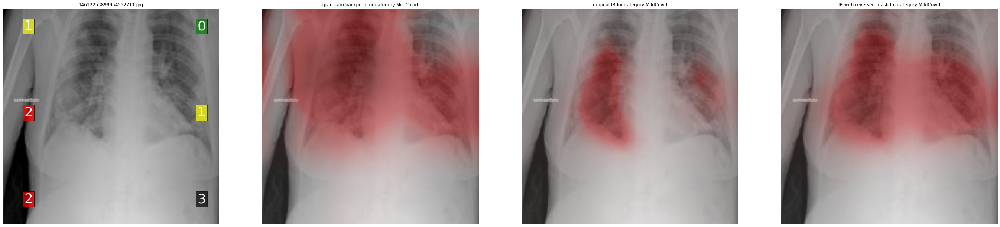

            Predicted Probability  Ground Truth
Finding                                        
MildCovid                   0.733          True
SevereCovid                 0.218         False
LowCovid                    0.057         False
NoCovid                     0.010         False


In [188]:
visualization_comparison()

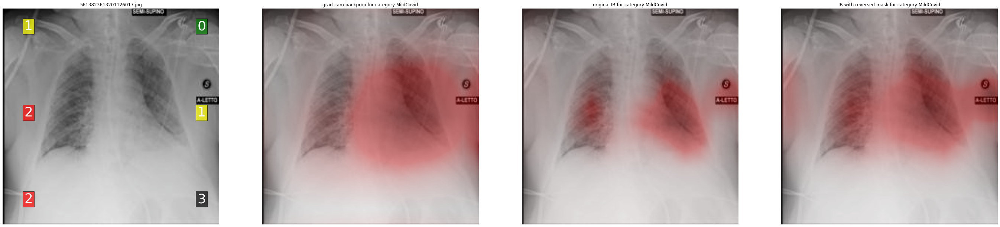

            Predicted Probability  Ground Truth
Finding                                        
MildCovid                   0.780          True
LowCovid                    0.145         False
SevereCovid                 0.075         False
NoCovid                     0.014         False


In [189]:
visualization_comparison()

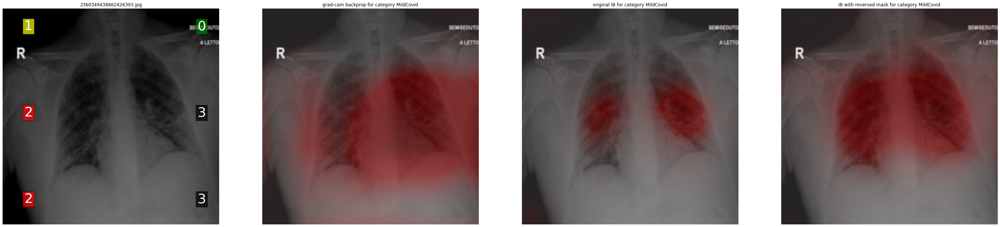

            Predicted Probability  Ground Truth
Finding                                        
MildCovid                   0.781          True
LowCovid                    0.195         False
SevereCovid                 0.034         False
NoCovid                     0.010         False


In [190]:
visualization_comparison()

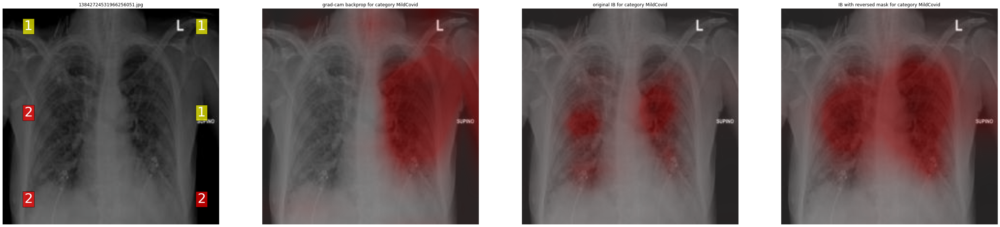

            Predicted Probability  Ground Truth
Finding                                        
MildCovid                   0.485          True
SevereCovid                 0.417         False
LowCovid                    0.030         False
NoCovid                     0.006         False


In [191]:
visualization_comparison()

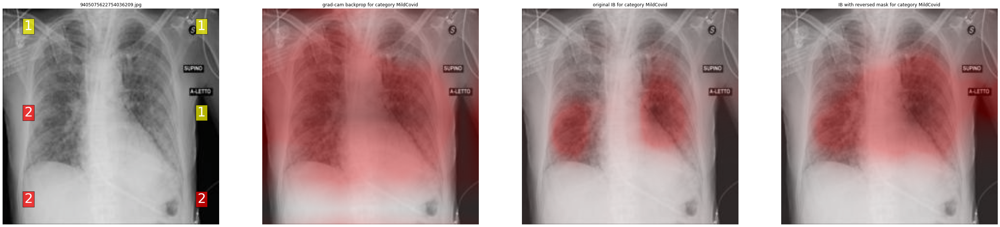

            Predicted Probability  Ground Truth
Finding                                        
MildCovid                   0.754          True
SevereCovid                 0.165         False
LowCovid                    0.054         False
NoCovid                     0.010         False


In [192]:
visualization_comparison()

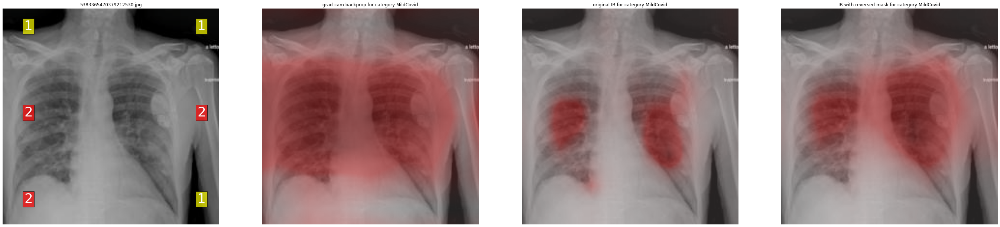

            Predicted Probability  Ground Truth
Finding                                        
MildCovid                   0.813          True
LowCovid                    0.136         False
SevereCovid                 0.064         False
NoCovid                     0.007         False


In [193]:
visualization_comparison()

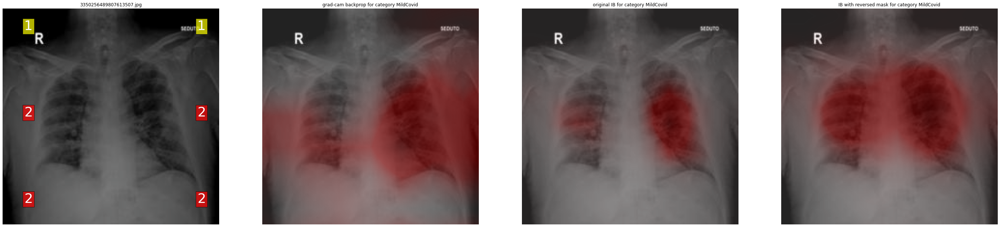

            Predicted Probability  Ground Truth
Finding                                        
MildCovid                   0.586          True
SevereCovid                 0.320         False
LowCovid                    0.054         False
NoCovid                     0.012         False


In [194]:
visualization_comparison()

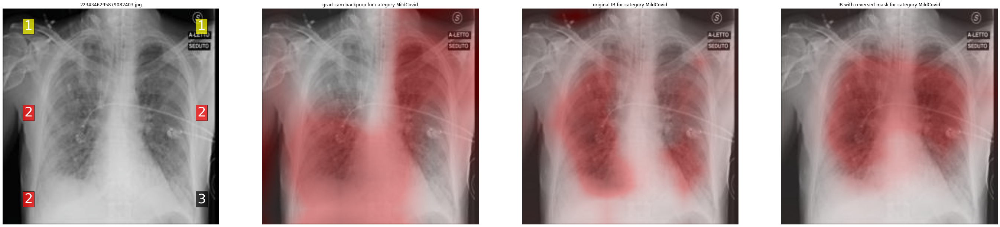

            Predicted Probability  Ground Truth
Finding                                        
MildCovid                   0.672          True
SevereCovid                 0.358         False
LowCovid                    0.041         False
NoCovid                     0.009         False


In [195]:
visualization_comparison()

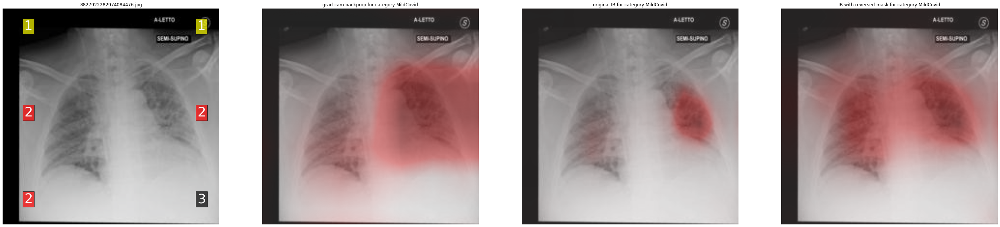

            Predicted Probability  Ground Truth
Finding                                        
MildCovid                   0.811          True
SevereCovid                 0.073         False
LowCovid                    0.050         False
NoCovid                     0.006         False


In [196]:
visualization_comparison()

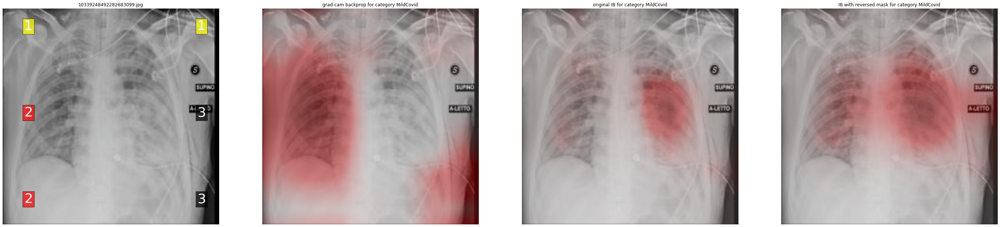

            Predicted Probability  Ground Truth
Finding                                        
SevereCovid                 0.603         False
MildCovid                   0.569          True
LowCovid                    0.015         False
NoCovid                     0.004         False


In [197]:
visualization_comparison()

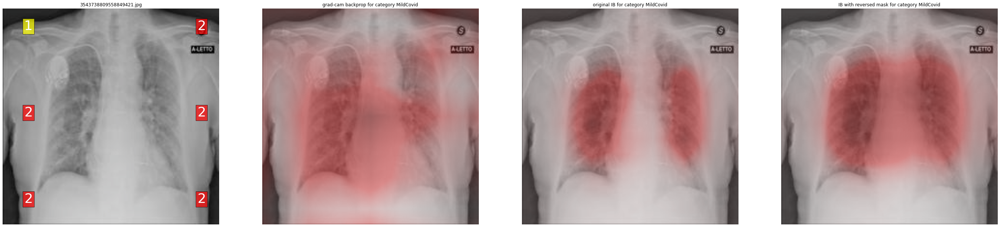

            Predicted Probability  Ground Truth
Finding                                        
MildCovid                   0.701          True
LowCovid                    0.112         False
SevereCovid                 0.111         False
NoCovid                     0.014         False


In [198]:
visualization_comparison()

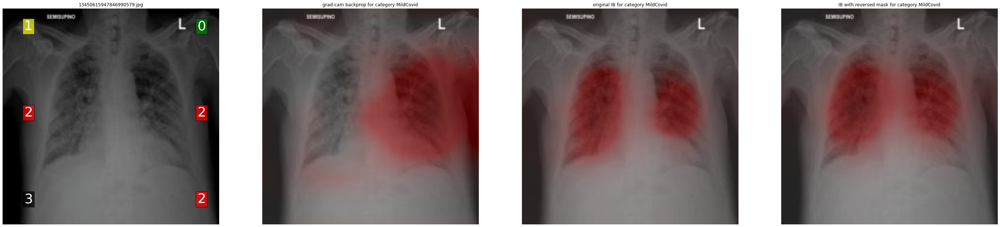

            Predicted Probability  Ground Truth
Finding                                        
MildCovid                   0.575          True
SevereCovid                 0.386         False
LowCovid                    0.050         False
NoCovid                     0.017         False


In [199]:
visualization_comparison()

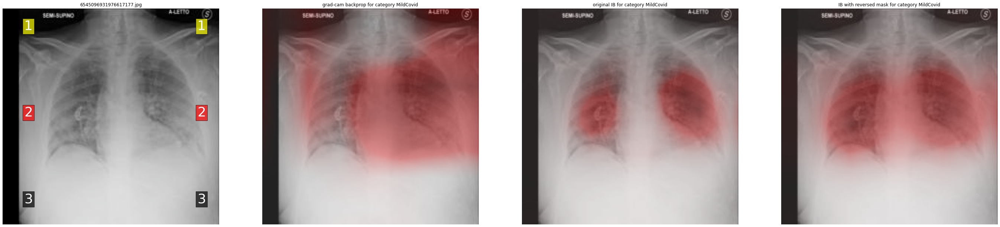

            Predicted Probability  Ground Truth
Finding                                        
MildCovid                   0.675          True
SevereCovid                 0.128         False
LowCovid                    0.112         False
NoCovid                     0.012         False


In [200]:
visualization_comparison()

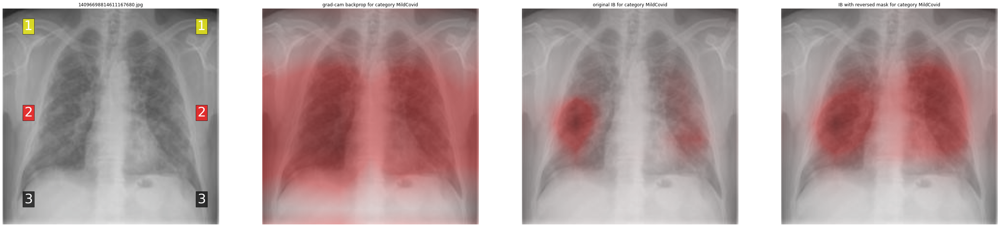

            Predicted Probability  Ground Truth
Finding                                        
MildCovid                   0.910          True
SevereCovid                 0.067         False
LowCovid                    0.052         False
NoCovid                     0.005         False


In [201]:
visualization_comparison()

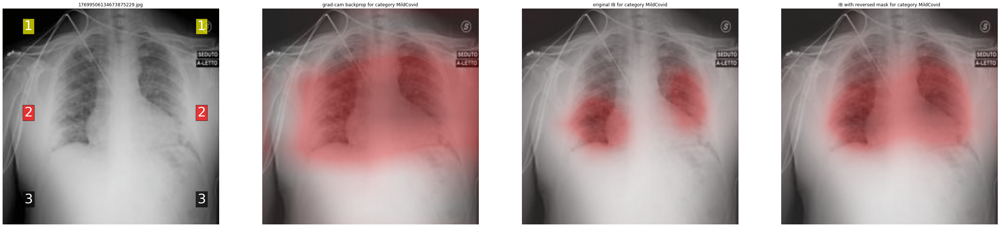

            Predicted Probability  Ground Truth
Finding                                        
MildCovid                   0.702          True
SevereCovid                 0.174         False
LowCovid                    0.068         False
NoCovid                     0.013         False


In [202]:
visualization_comparison()

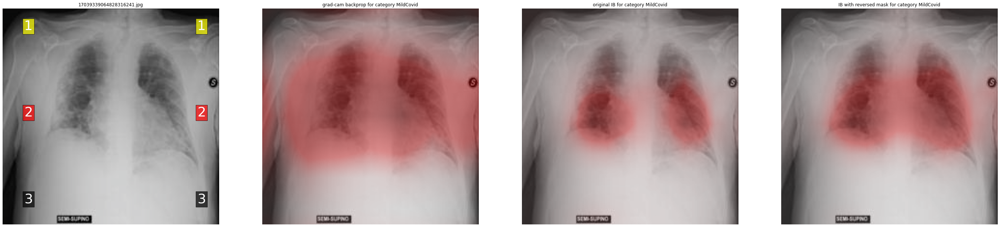

            Predicted Probability  Ground Truth
Finding                                        
MildCovid                   0.810          True
SevereCovid                 0.196         False
LowCovid                    0.046         False
NoCovid                     0.012         False


In [203]:
visualization_comparison()